In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import itertools
import torchvision
from torch.utils.data import Dataset
import numpy as np
from torchvision import  transforms


尝试使用CycleGAN进行卡通人脸实现，人脸数据来自于[celeba—A](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)，卡通人脸数据来自于[开源项目](https://github.com/minivision-ai/photo2cartoon)，参考(https://github.com/Lornatang/CycleGAN-PyTorch)

In [2]:
image_size = 256
batch_Size = 4
lr = 0.0002
epochs = 200
decay_epochs = 100 #epoch from which to start lr decay
print_freq = 10
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
#device = 'cpu'


In [26]:
A_dir = 'data/hw_data/old-young/trainA/'
B_dir = 'data/hw_data/old-young/trainB/'


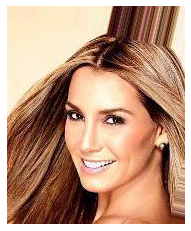

In [4]:
from PIL import Image
import matplotlib.pyplot as plt
import os
img = Image.open(os.path.join(A_dir ,os.listdir(A_dir)[0]))
plt.imshow(img)
plt.axis('off')
plt.show()


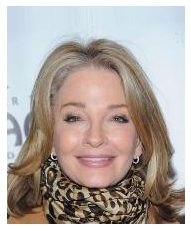

In [5]:
img = Image.open(os.path.join(B_dir ,os.listdir(B_dir)[0]))
plt.imshow(img)
plt.axis('off')
plt.show()

In [6]:
train_transform = transforms.Compose([#图像预处理的操作
                           transforms.Resize((int(image_size * 1.12),int(image_size * 1.12))),
                           transforms.RandomCrop(image_size),#随机裁剪
                           transforms.RandomHorizontalFlip(),
                           transforms.ToTensor(),
                           transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
                           ])
test_transform = transforms.Compose([
                           transforms.Resize((image_size,image_size)),
                           transforms.ToTensor(),
                           transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
                       ])

![](https://cdn.mathpix.com/snip/images/4VEAjWEc-FeUWH1w8I2OcqiwpKDIiaa-eIAlAQbqV84.original.fullsize.png)

In [10]:
class ImageDataset_train(Dataset):
    def __init__(self, A_dir,B_dir,transform):
        super(ImageDataset_train,self).__init__()
        files_A = os.listdir(A_dir)
        self.files_A = files_A[:int(len(files_A)*0.7)]
        files_B = os.listdir(B_dir)
        self.files_B = files_B[:int(len(files_B)*0.7)]
        self.A_dir = A_dir
        self.B_dir = B_dir
        print(len(self.files_A), len(self.files_A))
        
        self.transform = transform
    def __getitem__(self, idx):
        item_A = self.transform(Image.open(os.path.join(self.A_dir,self.files_A[idx % len(self.files_A)])).convert('RGB'))
        item_B = self.transform(Image.open(os.path.join(self.B_dir,self.files_B[idx % len(self.files_B)])).convert('RGB'))
        return {"A": item_A, "B": item_B}
    def __len__(self):
        return max(len(self.files_A), len(self.files_B))
    
class ImageDataset_test(Dataset):
    def __init__(self, A_dir,B_dir,transform):
        super(ImageDataset_test,self).__init__()
        files_A = os.listdir(A_dir)
        self.files_A = files_A[int(len(files_A)*0.7):]
        files_B = os.listdir(B_dir)
        self.files_B = files_B[int(len(files_B)*0.7):]
        self.A_dir = A_dir
        self.B_dir = B_dir
        print(len(self.files_A), len(self.files_A))
        
        self.transform = transform
    def __getitem__(self, idx):
        item_A = self.transform(Image.open(os.path.join(self.A_dir,self.files_A[idx % len(self.files_A)])).convert('RGB'))
        item_B = self.transform(Image.open(os.path.join(self.B_dir,self.files_B[idx % len(self.files_B)])).convert('RGB'))
        return {"A": item_A, "B": item_B}
    def __len__(self):
        return max(len(self.files_A), len(self.files_B))
    

In [27]:
train_set = ImageDataset_train(A_dir,B_dir,train_transform)
test_set = ImageDataset_test(A_dir,B_dir,test_transform)
train_loader =  torch.utils.data.DataLoader(train_set, batch_size=batch_Size, shuffle=True)
test_loader =  torch.utils.data.DataLoader(test_set, batch_size=batch_Size, shuffle=False)

119 119
52 52


In [12]:
len(os.listdir(A_dir))

171

In [13]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(64, 128, 4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(128, 256, 4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
           
            nn.Conv2d(256, 512, 4, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(512, 1, 4, padding=1),
        )#输出并不是一个数，而是通道数为1的小图

    def forward(self, x):
        x = self.main(x)
        x = F.avg_pool2d(x, x.size()[2:])#进行平均池化
        x = torch.flatten(x, 1)#batch_size,1
        return x

# 包含3个的卷积层
# 9个残差模块，每个残差块包含2个卷积层
# 两个微步卷积层
# 卷积层将特征映射为3通道GRB。
# 输入和输出的大小是一样的


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # Initial convolution block
            nn.ReflectionPad2d(3),#输入数据进行扩充
            nn.Conv2d(3, 64, 7),
            nn.InstanceNorm2d(64),#归一化层
            nn.ReLU(inplace=True),

            # Downsampling
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True),

            # Residual blocks
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),

            # Upsampling
            nn.ConvTranspose2d(256, 128, 3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True),

            # Output layer
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, 3, 7),
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x)


class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()

        self.res = nn.Sequential(nn.ReflectionPad2d(1),
                                 nn.Conv2d(in_channels, in_channels, 3),
                                 nn.InstanceNorm2d(in_channels),
                                 nn.ReLU(inplace=True),
                                 nn.ReflectionPad2d(1),
                                 nn.Conv2d(in_channels, in_channels, 3),
                                 nn.InstanceNorm2d(in_channels))

    def forward(self, x):
        return x + self.res(x)

In [14]:
#两个生成器两个判别器
netG_A2B = Generator().to(device)
netG_B2A = Generator().to(device)
netD_A = Discriminator().to(device)
netD_B = Discriminator().to(device)

G_A2B – 学习将A风格转换成B风格

G_A2B – 学习将B风格转换成A风格

D_A – 学习判断是否为A风格的图像

D_B -学习判断是否为B风格的图像

In [15]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight, 1.0, 0.02)
        torch.nn.init.zeros_(m.bias)
netG_A2B.apply(weights_init)
netG_B2A.apply(weights_init)
netD_A.apply(weights_init)
netD_B.apply(weights_init)
#损失函数
cycle_loss = torch.nn.L1Loss()#循环一致性损失
identity_loss = torch.nn.L1Loss()#是否能重新建构 以G_A2B来说，是否在丢入 real_B的图片后，确实能输出B风格的图片，是否能保持原样
adversarial_loss = torch.nn.MSELoss()#GAN损失


In [16]:
optimizer_G = torch.optim.Adam(itertools.chain(netG_A2B.parameters(), netG_B2A.parameters()),
                               lr=lr, betas=(0.5, 0.999))
optimizer_D_A = torch.optim.Adam(netD_A.parameters(), lr=lr, betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(netD_B.parameters(), lr=lr, betas=(0.5, 0.999))

In [17]:
#学习率衰减：
class DecayLR:
    def __init__(self, epochs, offset, decay_epochs):
        epoch_flag = epochs - decay_epochs
        assert (epoch_flag > 0), "Decay must start before the training session ends!"
        self.epochs = epochs
        self.offset = offset
        self.decay_epochs = decay_epochs

    def step(self, epoch):
        return 1.0 - max(0, epoch + self.offset - self.decay_epochs) / (
                self.epochs - self.decay_epochs)

In [18]:
lr_lambda = DecayLR(epochs, 0,decay_epochs).step
lr_scheduler_G = torch.optim.lr_scheduler.LambdaLR(optimizer_G, lr_lambda=lr_lambda)
lr_scheduler_D_A = torch.optim.lr_scheduler.LambdaLR(optimizer_D_A, lr_lambda=lr_lambda)
lr_scheduler_D_B = torch.optim.lr_scheduler.LambdaLR(optimizer_D_B, lr_lambda=lr_lambda)
# torch.optim.lr_scheduler.LambdaLR里面有一个参数lr_lambda是要输入学习率，
# 这个学习率是动态变化的，由LambdaLR(opt.n_epochs, opt.epoch, opt.decay_epoch).step来获得。


[lr_scheduler](https://blog.csdn.net/qyhaill/article/details/103043637)

In [19]:
#ReplayBuffer概念比较像是储存50张生成的图像并且从其中随机抓取来做预测，目的可能是利用历史样本，防止模式坍塌
#不使用也是可以的
import random
class ReplayBuffer:
    def __init__(self, max_size=50):
        assert (max_size > 0), "Empty buffer or trying to create a black hole. Be careful."
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.uniform(0, 1) > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return torch.cat(to_return)

In [20]:
g_losses = []
d_losses = []

identity_losses = []
gan_losses = []
cycle_losses = []

fake_A_buffer = ReplayBuffer()
fake_B_buffer = ReplayBuffer()

[0/199][0/29] Loss_D: 1.4550 Loss_G: 21.3374 Loss_G_identity: 6.2090 loss_G_GAN: 2.7621 loss_G_cycle: 12.3662
[0/199][10/29] Loss_D: 0.5295 Loss_G: 9.8052 Loss_G_identity: 2.7433 loss_G_GAN: 0.9615 loss_G_cycle: 6.1005
[0/199][20/29] Loss_D: 0.3915 Loss_G: 7.3855 Loss_G_identity: 1.9391 loss_G_GAN: 1.0039 loss_G_cycle: 4.4425


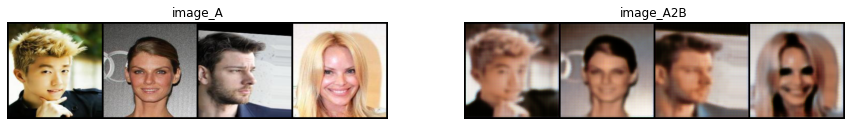

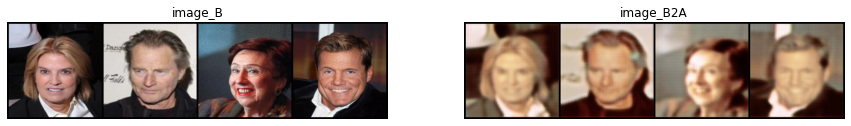

[1/199][0/29] Loss_D: 0.7232 Loss_G: 7.9882 Loss_G_identity: 2.2503 loss_G_GAN: 0.4777 loss_G_cycle: 5.2602
[1/199][10/29] Loss_D: 0.4223 Loss_G: 7.6435 Loss_G_identity: 2.2794 loss_G_GAN: 0.3968 loss_G_cycle: 4.9674
[1/199][20/29] Loss_D: 0.5144 Loss_G: 8.3131 Loss_G_identity: 2.4064 loss_G_GAN: 0.5187 loss_G_cycle: 5.3880
[2/199][0/29] Loss_D: 0.4319 Loss_G: 6.9007 Loss_G_identity: 1.9749 loss_G_GAN: 0.5573 loss_G_cycle: 4.3686
[2/199][10/29] Loss_D: 0.3093 Loss_G: 8.3066 Loss_G_identity: 2.1467 loss_G_GAN: 1.2169 loss_G_cycle: 4.9430
[2/199][20/29] Loss_D: 0.6904 Loss_G: 5.5923 Loss_G_identity: 1.6854 loss_G_GAN: 0.2412 loss_G_cycle: 3.6657
[3/199][0/29] Loss_D: 0.3669 Loss_G: 7.1223 Loss_G_identity: 1.8022 loss_G_GAN: 1.2020 loss_G_cycle: 4.1181
[3/199][10/29] Loss_D: 0.4301 Loss_G: 6.8530 Loss_G_identity: 1.9079 loss_G_GAN: 0.4194 loss_G_cycle: 4.5257
[3/199][20/29] Loss_D: 0.4441 Loss_G: 6.9726 Loss_G_identity: 1.7615 loss_G_GAN: 0.7577 loss_G_cycle: 4.4534
[4/199][0/29] Loss_D: 

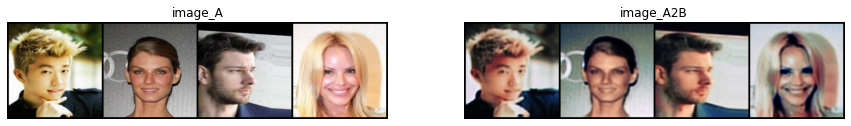

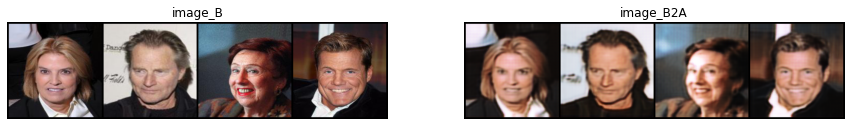

[11/199][0/29] Loss_D: 0.2881 Loss_G: 5.9953 Loss_G_identity: 1.5602 loss_G_GAN: 0.9963 loss_G_cycle: 3.4388
[11/199][10/29] Loss_D: 0.4643 Loss_G: 5.9410 Loss_G_identity: 1.4145 loss_G_GAN: 1.2488 loss_G_cycle: 3.2777
[11/199][20/29] Loss_D: 0.4411 Loss_G: 5.8991 Loss_G_identity: 1.3876 loss_G_GAN: 1.3049 loss_G_cycle: 3.2065
[12/199][0/29] Loss_D: 0.3017 Loss_G: 5.1344 Loss_G_identity: 1.2857 loss_G_GAN: 1.0526 loss_G_cycle: 2.7961
[12/199][10/29] Loss_D: 0.3483 Loss_G: 6.0990 Loss_G_identity: 1.6499 loss_G_GAN: 0.6905 loss_G_cycle: 3.7587
[12/199][20/29] Loss_D: 0.4634 Loss_G: 6.3546 Loss_G_identity: 1.5011 loss_G_GAN: 1.8591 loss_G_cycle: 2.9944
[13/199][0/29] Loss_D: 0.3340 Loss_G: 6.7168 Loss_G_identity: 1.4930 loss_G_GAN: 2.2114 loss_G_cycle: 3.0124
[13/199][10/29] Loss_D: 0.4140 Loss_G: 5.0597 Loss_G_identity: 1.4278 loss_G_GAN: 0.4936 loss_G_cycle: 3.1383
[13/199][20/29] Loss_D: 0.4352 Loss_G: 5.6165 Loss_G_identity: 1.5623 loss_G_GAN: 0.5756 loss_G_cycle: 3.4787
[14/199][0/29

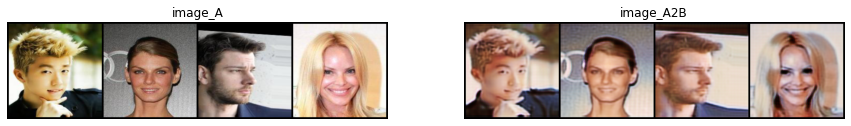

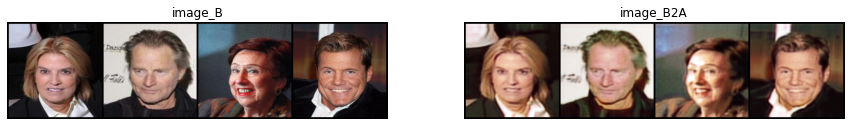

[21/199][0/29] Loss_D: 0.2820 Loss_G: 7.0517 Loss_G_identity: 1.5773 loss_G_GAN: 1.4394 loss_G_cycle: 4.0350
[21/199][10/29] Loss_D: 0.3208 Loss_G: 5.5363 Loss_G_identity: 1.5664 loss_G_GAN: 0.5482 loss_G_cycle: 3.4216
[21/199][20/29] Loss_D: 0.3033 Loss_G: 5.7558 Loss_G_identity: 1.4083 loss_G_GAN: 1.3268 loss_G_cycle: 3.0208
[22/199][0/29] Loss_D: 0.4698 Loss_G: 5.3504 Loss_G_identity: 1.3677 loss_G_GAN: 0.7445 loss_G_cycle: 3.2382
[22/199][10/29] Loss_D: 0.2929 Loss_G: 5.1658 Loss_G_identity: 1.3660 loss_G_GAN: 0.6261 loss_G_cycle: 3.1738
[22/199][20/29] Loss_D: 0.5546 Loss_G: 4.9898 Loss_G_identity: 1.2020 loss_G_GAN: 0.7140 loss_G_cycle: 3.0738
[23/199][0/29] Loss_D: 0.2332 Loss_G: 5.0826 Loss_G_identity: 1.1809 loss_G_GAN: 1.0034 loss_G_cycle: 2.8984
[23/199][10/29] Loss_D: 0.2664 Loss_G: 4.9680 Loss_G_identity: 1.3431 loss_G_GAN: 0.8617 loss_G_cycle: 2.7632
[23/199][20/29] Loss_D: 0.3880 Loss_G: 5.3582 Loss_G_identity: 1.3880 loss_G_GAN: 1.0324 loss_G_cycle: 2.9377
[24/199][0/29

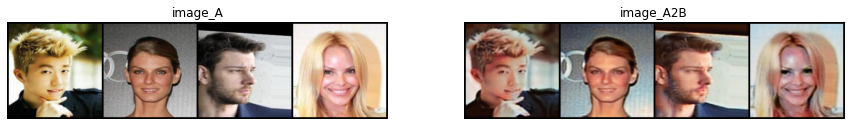

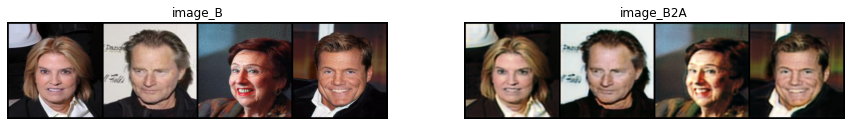

[31/199][0/29] Loss_D: 0.2059 Loss_G: 5.1509 Loss_G_identity: 1.3483 loss_G_GAN: 0.8429 loss_G_cycle: 2.9598
[31/199][10/29] Loss_D: 0.2937 Loss_G: 5.3045 Loss_G_identity: 1.2763 loss_G_GAN: 0.9223 loss_G_cycle: 3.1059
[31/199][20/29] Loss_D: 0.1680 Loss_G: 4.7633 Loss_G_identity: 1.1919 loss_G_GAN: 0.9938 loss_G_cycle: 2.5776
[32/199][0/29] Loss_D: 0.4733 Loss_G: 5.1048 Loss_G_identity: 1.0985 loss_G_GAN: 1.5811 loss_G_cycle: 2.4252
[32/199][10/29] Loss_D: 0.4730 Loss_G: 5.1498 Loss_G_identity: 1.3511 loss_G_GAN: 0.8505 loss_G_cycle: 2.9482
[32/199][20/29] Loss_D: 0.3912 Loss_G: 4.4730 Loss_G_identity: 1.1359 loss_G_GAN: 0.4892 loss_G_cycle: 2.8479
[33/199][0/29] Loss_D: 0.2582 Loss_G: 6.1763 Loss_G_identity: 1.5854 loss_G_GAN: 0.7577 loss_G_cycle: 3.8333
[33/199][10/29] Loss_D: 0.2795 Loss_G: 6.3595 Loss_G_identity: 1.4538 loss_G_GAN: 1.5779 loss_G_cycle: 3.3278
[33/199][20/29] Loss_D: 0.3908 Loss_G: 5.6006 Loss_G_identity: 1.4268 loss_G_GAN: 0.7641 loss_G_cycle: 3.4097
[34/199][0/29

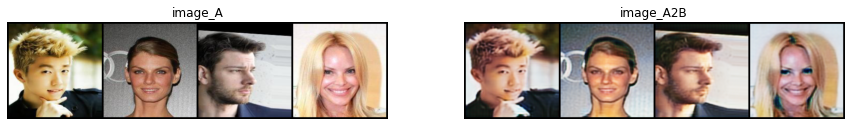

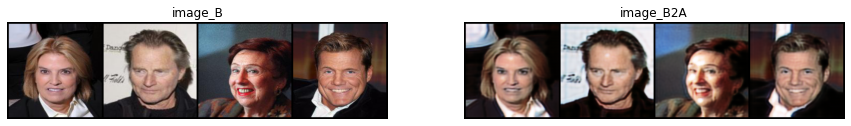

[41/199][0/29] Loss_D: 0.4256 Loss_G: 4.6173 Loss_G_identity: 0.9944 loss_G_GAN: 1.3617 loss_G_cycle: 2.2611
[41/199][10/29] Loss_D: 0.2048 Loss_G: 4.6132 Loss_G_identity: 1.0535 loss_G_GAN: 1.0228 loss_G_cycle: 2.5368
[41/199][20/29] Loss_D: 0.4951 Loss_G: 5.0102 Loss_G_identity: 1.2299 loss_G_GAN: 0.7991 loss_G_cycle: 2.9812
[42/199][0/29] Loss_D: 0.4373 Loss_G: 4.7431 Loss_G_identity: 1.1798 loss_G_GAN: 0.5872 loss_G_cycle: 2.9760
[42/199][10/29] Loss_D: 0.2627 Loss_G: 6.1671 Loss_G_identity: 1.4687 loss_G_GAN: 1.1162 loss_G_cycle: 3.5822
[42/199][20/29] Loss_D: 0.1664 Loss_G: 4.4530 Loss_G_identity: 1.0600 loss_G_GAN: 1.0579 loss_G_cycle: 2.3351
[43/199][0/29] Loss_D: 0.4202 Loss_G: 4.7304 Loss_G_identity: 1.2058 loss_G_GAN: 1.1184 loss_G_cycle: 2.4063
[43/199][10/29] Loss_D: 0.3274 Loss_G: 3.9694 Loss_G_identity: 1.0125 loss_G_GAN: 0.7912 loss_G_cycle: 2.1657
[43/199][20/29] Loss_D: 0.2085 Loss_G: 4.5192 Loss_G_identity: 1.1256 loss_G_GAN: 0.8348 loss_G_cycle: 2.5587
[44/199][0/29

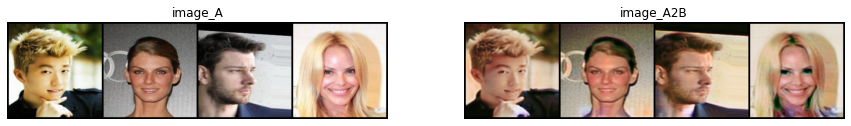

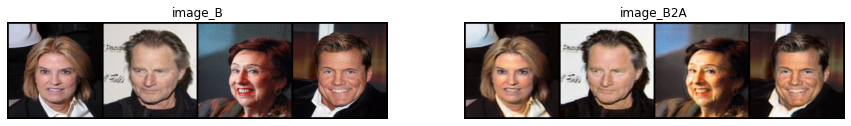

[51/199][0/29] Loss_D: 0.5987 Loss_G: 4.8306 Loss_G_identity: 1.1390 loss_G_GAN: 1.1372 loss_G_cycle: 2.5543
[51/199][10/29] Loss_D: 0.3352 Loss_G: 4.0441 Loss_G_identity: 0.9571 loss_G_GAN: 0.9367 loss_G_cycle: 2.1503
[51/199][20/29] Loss_D: 0.2860 Loss_G: 5.0921 Loss_G_identity: 1.3572 loss_G_GAN: 0.6449 loss_G_cycle: 3.0899
[52/199][0/29] Loss_D: 0.3106 Loss_G: 4.0097 Loss_G_identity: 0.9660 loss_G_GAN: 0.9535 loss_G_cycle: 2.0902
[52/199][10/29] Loss_D: 0.1507 Loss_G: 4.9503 Loss_G_identity: 1.2190 loss_G_GAN: 0.9151 loss_G_cycle: 2.8161
[52/199][20/29] Loss_D: 0.3719 Loss_G: 4.0692 Loss_G_identity: 0.8785 loss_G_GAN: 0.8995 loss_G_cycle: 2.2911
[53/199][0/29] Loss_D: 0.2899 Loss_G: 5.8337 Loss_G_identity: 1.4474 loss_G_GAN: 0.9194 loss_G_cycle: 3.4669
[53/199][10/29] Loss_D: 0.2889 Loss_G: 5.1078 Loss_G_identity: 0.9878 loss_G_GAN: 1.7984 loss_G_cycle: 2.3216
[53/199][20/29] Loss_D: 0.2167 Loss_G: 4.7308 Loss_G_identity: 1.0698 loss_G_GAN: 1.4085 loss_G_cycle: 2.2525
[54/199][0/29

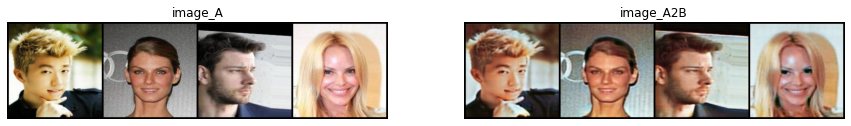

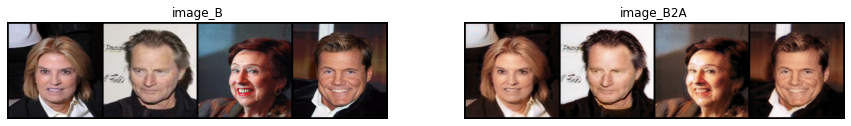

[61/199][0/29] Loss_D: 0.3151 Loss_G: 4.4397 Loss_G_identity: 1.0622 loss_G_GAN: 1.0149 loss_G_cycle: 2.3625
[61/199][10/29] Loss_D: 0.3882 Loss_G: 4.3059 Loss_G_identity: 0.8991 loss_G_GAN: 1.4810 loss_G_cycle: 1.9257
[61/199][20/29] Loss_D: 0.3999 Loss_G: 3.5929 Loss_G_identity: 0.9506 loss_G_GAN: 0.4835 loss_G_cycle: 2.1588
[62/199][0/29] Loss_D: 0.5027 Loss_G: 4.0567 Loss_G_identity: 1.0884 loss_G_GAN: 0.4358 loss_G_cycle: 2.5324
[62/199][10/29] Loss_D: 0.2677 Loss_G: 3.8547 Loss_G_identity: 0.8570 loss_G_GAN: 1.0684 loss_G_cycle: 1.9294
[62/199][20/29] Loss_D: 0.4331 Loss_G: 6.2788 Loss_G_identity: 1.3425 loss_G_GAN: 1.6162 loss_G_cycle: 3.3201
[63/199][0/29] Loss_D: 0.2436 Loss_G: 4.1106 Loss_G_identity: 0.9452 loss_G_GAN: 0.5600 loss_G_cycle: 2.6054
[63/199][10/29] Loss_D: 0.2444 Loss_G: 5.5886 Loss_G_identity: 1.4418 loss_G_GAN: 0.8060 loss_G_cycle: 3.3408
[63/199][20/29] Loss_D: 0.3301 Loss_G: 4.6826 Loss_G_identity: 1.0909 loss_G_GAN: 0.7039 loss_G_cycle: 2.8878
[64/199][0/29

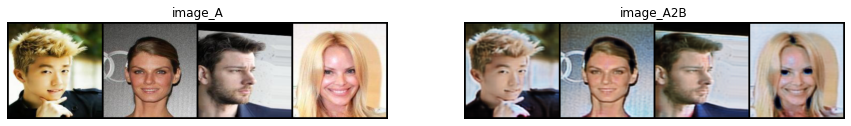

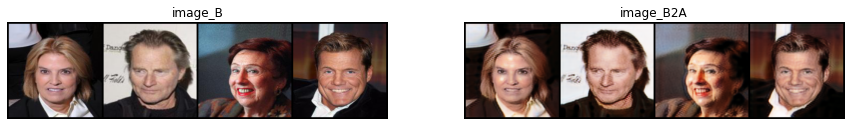

[71/199][0/29] Loss_D: 0.2331 Loss_G: 4.0001 Loss_G_identity: 1.0145 loss_G_GAN: 0.7262 loss_G_cycle: 2.2594
[71/199][10/29] Loss_D: 0.3300 Loss_G: 4.5239 Loss_G_identity: 0.9912 loss_G_GAN: 1.2356 loss_G_cycle: 2.2971
[71/199][20/29] Loss_D: 0.2440 Loss_G: 4.3843 Loss_G_identity: 1.0640 loss_G_GAN: 0.7260 loss_G_cycle: 2.5943
[72/199][0/29] Loss_D: 0.3810 Loss_G: 3.4831 Loss_G_identity: 0.8319 loss_G_GAN: 0.8472 loss_G_cycle: 1.8040
[72/199][10/29] Loss_D: 0.1288 Loss_G: 4.0808 Loss_G_identity: 1.1122 loss_G_GAN: 0.5090 loss_G_cycle: 2.4596
[72/199][20/29] Loss_D: 0.3465 Loss_G: 3.8986 Loss_G_identity: 0.9122 loss_G_GAN: 0.9098 loss_G_cycle: 2.0766
[73/199][0/29] Loss_D: 0.3097 Loss_G: 4.7223 Loss_G_identity: 1.1014 loss_G_GAN: 0.8260 loss_G_cycle: 2.7949
[73/199][10/29] Loss_D: 0.2625 Loss_G: 3.6182 Loss_G_identity: 1.0440 loss_G_GAN: 0.3329 loss_G_cycle: 2.2413
[73/199][20/29] Loss_D: 0.2593 Loss_G: 3.9758 Loss_G_identity: 0.9380 loss_G_GAN: 0.9806 loss_G_cycle: 2.0572
[74/199][0/29

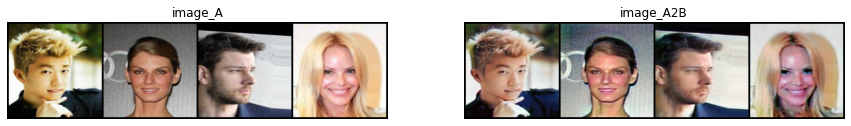

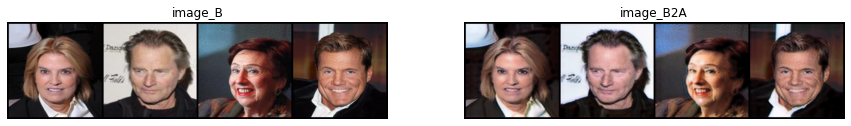

[81/199][0/29] Loss_D: 0.1935 Loss_G: 5.0510 Loss_G_identity: 1.1939 loss_G_GAN: 1.3877 loss_G_cycle: 2.4694
[81/199][10/29] Loss_D: 0.2569 Loss_G: 4.1060 Loss_G_identity: 0.9870 loss_G_GAN: 0.9588 loss_G_cycle: 2.1602
[81/199][20/29] Loss_D: 0.1992 Loss_G: 4.1248 Loss_G_identity: 0.9152 loss_G_GAN: 0.9803 loss_G_cycle: 2.2293
[82/199][0/29] Loss_D: 0.1693 Loss_G: 3.9836 Loss_G_identity: 0.9589 loss_G_GAN: 0.7048 loss_G_cycle: 2.3200
[82/199][10/29] Loss_D: 0.3211 Loss_G: 3.8757 Loss_G_identity: 1.0247 loss_G_GAN: 0.5657 loss_G_cycle: 2.2853
[82/199][20/29] Loss_D: 0.3299 Loss_G: 4.0746 Loss_G_identity: 1.0492 loss_G_GAN: 0.8145 loss_G_cycle: 2.2110
[83/199][0/29] Loss_D: 0.1421 Loss_G: 4.2258 Loss_G_identity: 0.9112 loss_G_GAN: 1.1084 loss_G_cycle: 2.2062
[83/199][10/29] Loss_D: 0.2772 Loss_G: 3.7496 Loss_G_identity: 0.9242 loss_G_GAN: 0.9113 loss_G_cycle: 1.9142
[83/199][20/29] Loss_D: 0.4222 Loss_G: 3.2724 Loss_G_identity: 0.8679 loss_G_GAN: 0.4900 loss_G_cycle: 1.9146
[84/199][0/29

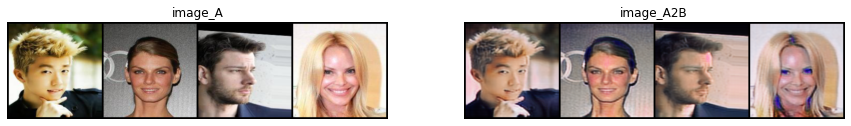

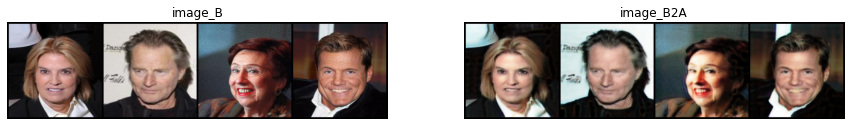

[91/199][0/29] Loss_D: 0.3008 Loss_G: 4.2579 Loss_G_identity: 1.0563 loss_G_GAN: 0.7345 loss_G_cycle: 2.4671
[91/199][10/29] Loss_D: 0.1734 Loss_G: 4.7361 Loss_G_identity: 0.9606 loss_G_GAN: 1.5923 loss_G_cycle: 2.1832
[91/199][20/29] Loss_D: 0.3155 Loss_G: 4.2297 Loss_G_identity: 1.1487 loss_G_GAN: 0.6251 loss_G_cycle: 2.4560
[92/199][0/29] Loss_D: 0.2634 Loss_G: 4.3230 Loss_G_identity: 1.0806 loss_G_GAN: 0.8647 loss_G_cycle: 2.3777
[92/199][10/29] Loss_D: 0.2301 Loss_G: 3.9409 Loss_G_identity: 1.0733 loss_G_GAN: 0.7659 loss_G_cycle: 2.1017
[92/199][20/29] Loss_D: 0.3225 Loss_G: 4.7352 Loss_G_identity: 0.9673 loss_G_GAN: 1.3906 loss_G_cycle: 2.3773
[93/199][0/29] Loss_D: 0.4551 Loss_G: 3.6358 Loss_G_identity: 0.9566 loss_G_GAN: 0.3650 loss_G_cycle: 2.3141
[93/199][10/29] Loss_D: 0.1414 Loss_G: 4.0070 Loss_G_identity: 1.0235 loss_G_GAN: 0.7592 loss_G_cycle: 2.2244
[93/199][20/29] Loss_D: 0.2454 Loss_G: 4.8132 Loss_G_identity: 0.9685 loss_G_GAN: 1.4265 loss_G_cycle: 2.4183
[94/199][0/29

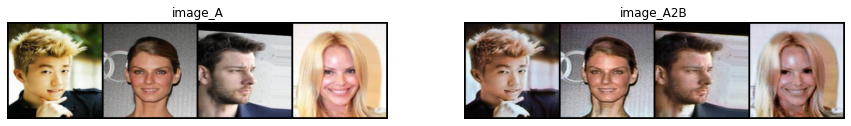

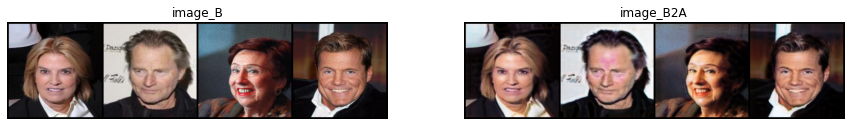

[101/199][0/29] Loss_D: 0.8062 Loss_G: 4.9679 Loss_G_identity: 1.0076 loss_G_GAN: 1.7559 loss_G_cycle: 2.2044
[101/199][10/29] Loss_D: 0.2130 Loss_G: 3.6918 Loss_G_identity: 0.8706 loss_G_GAN: 0.6920 loss_G_cycle: 2.1291
[101/199][20/29] Loss_D: 0.2612 Loss_G: 4.5570 Loss_G_identity: 1.0961 loss_G_GAN: 1.1304 loss_G_cycle: 2.3305
[102/199][0/29] Loss_D: 0.2720 Loss_G: 3.9175 Loss_G_identity: 0.9294 loss_G_GAN: 0.7015 loss_G_cycle: 2.2865
[102/199][10/29] Loss_D: 0.3858 Loss_G: 4.3806 Loss_G_identity: 1.0565 loss_G_GAN: 0.9431 loss_G_cycle: 2.3810
[102/199][20/29] Loss_D: 0.1960 Loss_G: 3.6462 Loss_G_identity: 0.9367 loss_G_GAN: 0.7709 loss_G_cycle: 1.9387
[103/199][0/29] Loss_D: 0.2472 Loss_G: 3.7520 Loss_G_identity: 0.7686 loss_G_GAN: 0.9880 loss_G_cycle: 1.9954
[103/199][10/29] Loss_D: 0.1839 Loss_G: 3.7475 Loss_G_identity: 0.9238 loss_G_GAN: 0.8983 loss_G_cycle: 1.9253
[103/199][20/29] Loss_D: 0.2823 Loss_G: 4.6297 Loss_G_identity: 1.0723 loss_G_GAN: 0.6802 loss_G_cycle: 2.8771
[104

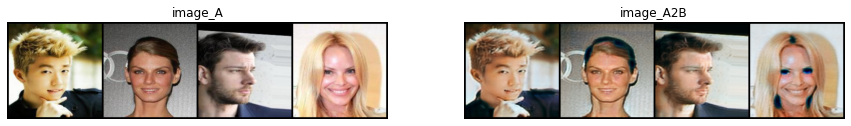

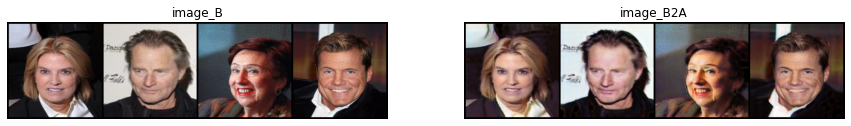

[111/199][0/29] Loss_D: 0.2352 Loss_G: 3.4880 Loss_G_identity: 0.7565 loss_G_GAN: 0.9019 loss_G_cycle: 1.8296
[111/199][10/29] Loss_D: 0.1378 Loss_G: 4.0732 Loss_G_identity: 0.8993 loss_G_GAN: 1.1754 loss_G_cycle: 1.9985
[111/199][20/29] Loss_D: 0.2524 Loss_G: 3.9088 Loss_G_identity: 0.9584 loss_G_GAN: 1.0694 loss_G_cycle: 1.8809
[112/199][0/29] Loss_D: 0.3001 Loss_G: 3.2033 Loss_G_identity: 0.7936 loss_G_GAN: 0.5351 loss_G_cycle: 1.8746
[112/199][10/29] Loss_D: 0.2958 Loss_G: 3.7767 Loss_G_identity: 0.9591 loss_G_GAN: 0.3953 loss_G_cycle: 2.4223
[112/199][20/29] Loss_D: 0.1988 Loss_G: 4.3303 Loss_G_identity: 1.0463 loss_G_GAN: 0.9222 loss_G_cycle: 2.3618
[113/199][0/29] Loss_D: 0.1611 Loss_G: 5.7448 Loss_G_identity: 1.2023 loss_G_GAN: 1.2477 loss_G_cycle: 3.2948
[113/199][10/29] Loss_D: 0.2274 Loss_G: 3.8992 Loss_G_identity: 0.9134 loss_G_GAN: 1.2229 loss_G_cycle: 1.7629
[113/199][20/29] Loss_D: 0.2318 Loss_G: 3.7954 Loss_G_identity: 0.8953 loss_G_GAN: 1.1865 loss_G_cycle: 1.7136
[114

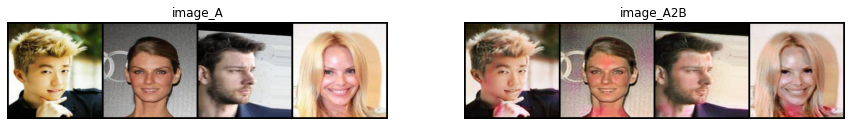

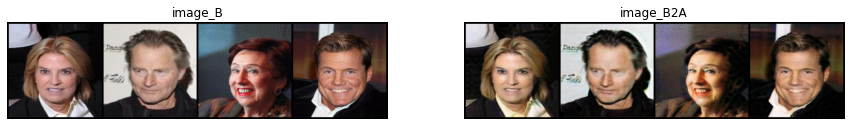

[121/199][0/29] Loss_D: 0.0877 Loss_G: 4.2667 Loss_G_identity: 0.8771 loss_G_GAN: 1.4578 loss_G_cycle: 1.9318
[121/199][10/29] Loss_D: 0.3318 Loss_G: 3.7881 Loss_G_identity: 0.9178 loss_G_GAN: 0.9851 loss_G_cycle: 1.8852
[121/199][20/29] Loss_D: 0.2503 Loss_G: 4.1896 Loss_G_identity: 0.9090 loss_G_GAN: 1.1641 loss_G_cycle: 2.1165
[122/199][0/29] Loss_D: 0.1921 Loss_G: 4.1644 Loss_G_identity: 0.9434 loss_G_GAN: 1.0242 loss_G_cycle: 2.1968
[122/199][10/29] Loss_D: 0.3906 Loss_G: 4.3496 Loss_G_identity: 0.8216 loss_G_GAN: 1.6103 loss_G_cycle: 1.9177
[122/199][20/29] Loss_D: 0.2977 Loss_G: 4.0680 Loss_G_identity: 0.8788 loss_G_GAN: 1.3212 loss_G_cycle: 1.8679
[123/199][0/29] Loss_D: 0.1387 Loss_G: 3.9892 Loss_G_identity: 0.8326 loss_G_GAN: 1.1775 loss_G_cycle: 1.9791
[123/199][10/29] Loss_D: 0.2563 Loss_G: 4.4326 Loss_G_identity: 1.0223 loss_G_GAN: 1.0874 loss_G_cycle: 2.3229
[123/199][20/29] Loss_D: 0.1606 Loss_G: 3.5670 Loss_G_identity: 0.9281 loss_G_GAN: 0.8141 loss_G_cycle: 1.8248
[124

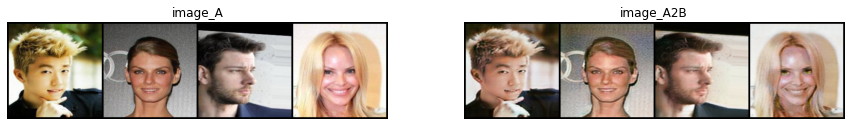

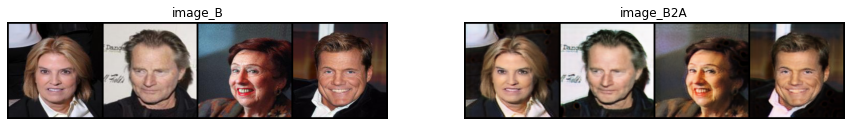

[131/199][0/29] Loss_D: 0.1900 Loss_G: 3.3136 Loss_G_identity: 0.7739 loss_G_GAN: 0.7853 loss_G_cycle: 1.7545
[131/199][10/29] Loss_D: 0.2121 Loss_G: 4.2499 Loss_G_identity: 1.0763 loss_G_GAN: 0.8685 loss_G_cycle: 2.3052
[131/199][20/29] Loss_D: 0.1744 Loss_G: 4.3936 Loss_G_identity: 1.0255 loss_G_GAN: 1.2695 loss_G_cycle: 2.0986
[132/199][0/29] Loss_D: 0.1256 Loss_G: 4.1835 Loss_G_identity: 0.8506 loss_G_GAN: 1.3176 loss_G_cycle: 2.0154
[132/199][10/29] Loss_D: 0.1547 Loss_G: 3.3361 Loss_G_identity: 0.7651 loss_G_GAN: 0.8164 loss_G_cycle: 1.7546
[132/199][20/29] Loss_D: 0.2800 Loss_G: 4.1821 Loss_G_identity: 0.7939 loss_G_GAN: 1.6205 loss_G_cycle: 1.7677
[133/199][0/29] Loss_D: 0.1597 Loss_G: 3.9341 Loss_G_identity: 0.7986 loss_G_GAN: 1.1631 loss_G_cycle: 1.9724
[133/199][10/29] Loss_D: 0.1468 Loss_G: 3.6304 Loss_G_identity: 0.8575 loss_G_GAN: 0.8154 loss_G_cycle: 1.9575
[133/199][20/29] Loss_D: 0.1591 Loss_G: 3.5969 Loss_G_identity: 0.7734 loss_G_GAN: 1.0575 loss_G_cycle: 1.7660
[134

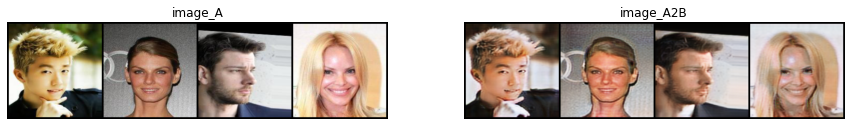

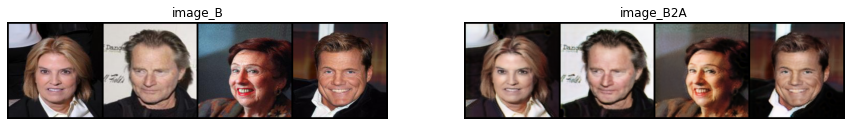

[141/199][0/29] Loss_D: 0.1457 Loss_G: 2.9732 Loss_G_identity: 0.6421 loss_G_GAN: 0.9154 loss_G_cycle: 1.4158
[141/199][10/29] Loss_D: 0.1656 Loss_G: 3.4570 Loss_G_identity: 0.7550 loss_G_GAN: 1.0459 loss_G_cycle: 1.6562
[141/199][20/29] Loss_D: 0.1884 Loss_G: 3.3846 Loss_G_identity: 0.8331 loss_G_GAN: 0.7547 loss_G_cycle: 1.7969
[142/199][0/29] Loss_D: 0.1784 Loss_G: 3.8322 Loss_G_identity: 0.8091 loss_G_GAN: 1.2636 loss_G_cycle: 1.7595
[142/199][10/29] Loss_D: 0.3068 Loss_G: 3.9987 Loss_G_identity: 0.7698 loss_G_GAN: 1.6046 loss_G_cycle: 1.6243
[142/199][20/29] Loss_D: 0.2507 Loss_G: 3.4385 Loss_G_identity: 0.7072 loss_G_GAN: 1.1899 loss_G_cycle: 1.5415
[143/199][0/29] Loss_D: 0.1650 Loss_G: 3.3966 Loss_G_identity: 0.7470 loss_G_GAN: 1.0567 loss_G_cycle: 1.5930
[143/199][10/29] Loss_D: 0.2008 Loss_G: 3.5468 Loss_G_identity: 0.7846 loss_G_GAN: 0.9834 loss_G_cycle: 1.7788
[143/199][20/29] Loss_D: 0.2187 Loss_G: 4.0218 Loss_G_identity: 0.8361 loss_G_GAN: 1.2717 loss_G_cycle: 1.9140
[144

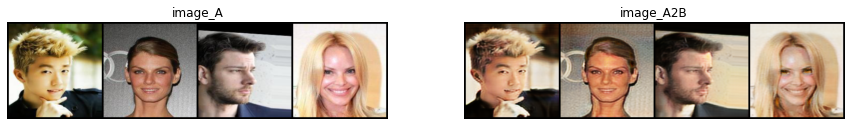

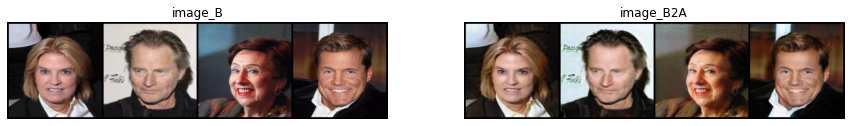

[151/199][0/29] Loss_D: 0.1282 Loss_G: 3.6459 Loss_G_identity: 0.7945 loss_G_GAN: 0.9390 loss_G_cycle: 1.9123
[151/199][10/29] Loss_D: 0.1766 Loss_G: 3.7714 Loss_G_identity: 0.8000 loss_G_GAN: 1.2049 loss_G_cycle: 1.7665
[151/199][20/29] Loss_D: 0.1658 Loss_G: 3.7819 Loss_G_identity: 0.8269 loss_G_GAN: 1.1876 loss_G_cycle: 1.7674
[152/199][0/29] Loss_D: 0.1908 Loss_G: 3.3145 Loss_G_identity: 0.7328 loss_G_GAN: 1.0126 loss_G_cycle: 1.5691
[152/199][10/29] Loss_D: 0.1107 Loss_G: 3.4433 Loss_G_identity: 0.7565 loss_G_GAN: 1.0764 loss_G_cycle: 1.6104
[152/199][20/29] Loss_D: 0.1749 Loss_G: 3.9414 Loss_G_identity: 0.8431 loss_G_GAN: 1.1747 loss_G_cycle: 1.9237
[153/199][0/29] Loss_D: 0.1070 Loss_G: 3.8198 Loss_G_identity: 0.8235 loss_G_GAN: 1.2336 loss_G_cycle: 1.7627
[153/199][10/29] Loss_D: 0.1230 Loss_G: 4.1117 Loss_G_identity: 0.9044 loss_G_GAN: 1.4362 loss_G_cycle: 1.7712
[153/199][20/29] Loss_D: 0.1439 Loss_G: 3.4951 Loss_G_identity: 0.7447 loss_G_GAN: 0.9189 loss_G_cycle: 1.8315
[154

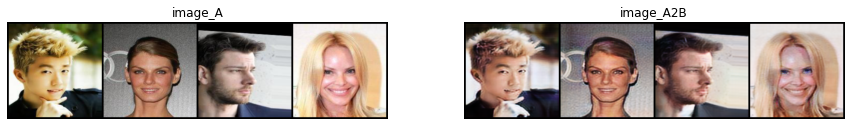

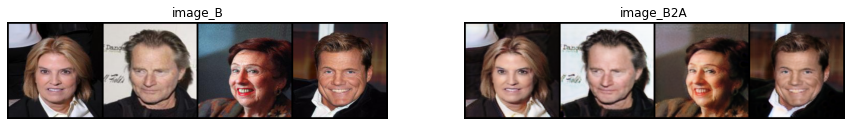

[161/199][0/29] Loss_D: 0.0721 Loss_G: 3.6223 Loss_G_identity: 0.6994 loss_G_GAN: 1.4652 loss_G_cycle: 1.4577
[161/199][10/29] Loss_D: 0.1142 Loss_G: 3.5053 Loss_G_identity: 0.6790 loss_G_GAN: 1.4183 loss_G_cycle: 1.4080
[161/199][20/29] Loss_D: 0.2432 Loss_G: 3.6880 Loss_G_identity: 0.8351 loss_G_GAN: 1.1191 loss_G_cycle: 1.7339
[162/199][0/29] Loss_D: 0.0980 Loss_G: 3.4388 Loss_G_identity: 0.7833 loss_G_GAN: 1.0511 loss_G_cycle: 1.6044
[162/199][10/29] Loss_D: 0.1568 Loss_G: 3.3016 Loss_G_identity: 0.7287 loss_G_GAN: 0.9212 loss_G_cycle: 1.6517
[162/199][20/29] Loss_D: 0.1824 Loss_G: 3.3621 Loss_G_identity: 0.7467 loss_G_GAN: 0.8814 loss_G_cycle: 1.7340
[163/199][0/29] Loss_D: 0.1199 Loss_G: 3.1417 Loss_G_identity: 0.5808 loss_G_GAN: 1.3786 loss_G_cycle: 1.1822
[163/199][10/29] Loss_D: 0.1286 Loss_G: 3.5758 Loss_G_identity: 0.8033 loss_G_GAN: 1.0241 loss_G_cycle: 1.7483
[163/199][20/29] Loss_D: 0.1527 Loss_G: 3.8655 Loss_G_identity: 0.7793 loss_G_GAN: 1.3785 loss_G_cycle: 1.7077
[164

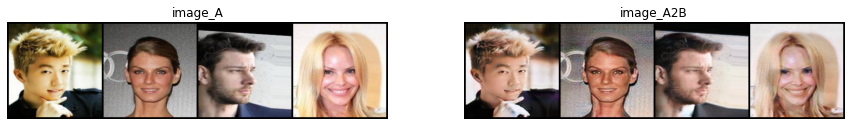

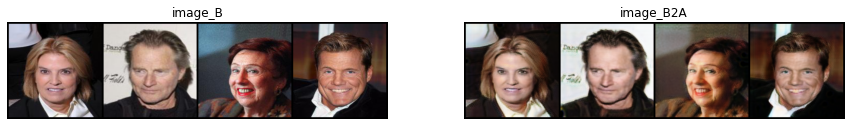

[171/199][0/29] Loss_D: 0.1522 Loss_G: 2.9847 Loss_G_identity: 0.6862 loss_G_GAN: 0.8435 loss_G_cycle: 1.4550
[171/199][10/29] Loss_D: 0.1175 Loss_G: 3.2987 Loss_G_identity: 0.6293 loss_G_GAN: 1.3506 loss_G_cycle: 1.3188
[171/199][20/29] Loss_D: 0.1316 Loss_G: 3.5011 Loss_G_identity: 0.7232 loss_G_GAN: 0.9947 loss_G_cycle: 1.7831
[172/199][0/29] Loss_D: 0.0997 Loss_G: 3.6640 Loss_G_identity: 0.7284 loss_G_GAN: 1.4187 loss_G_cycle: 1.5169
[172/199][10/29] Loss_D: 0.1204 Loss_G: 3.4663 Loss_G_identity: 0.6681 loss_G_GAN: 1.3193 loss_G_cycle: 1.4789
[172/199][20/29] Loss_D: 0.1643 Loss_G: 3.9290 Loss_G_identity: 0.8259 loss_G_GAN: 1.2768 loss_G_cycle: 1.8263
[173/199][0/29] Loss_D: 0.1888 Loss_G: 3.2666 Loss_G_identity: 0.6545 loss_G_GAN: 1.2266 loss_G_cycle: 1.3855
[173/199][10/29] Loss_D: 0.1401 Loss_G: 3.4823 Loss_G_identity: 0.7876 loss_G_GAN: 1.0019 loss_G_cycle: 1.6928
[173/199][20/29] Loss_D: 0.1406 Loss_G: 3.6453 Loss_G_identity: 0.7524 loss_G_GAN: 1.3275 loss_G_cycle: 1.5655
[174

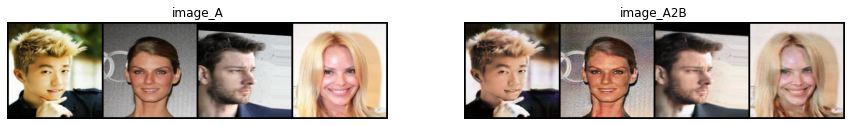

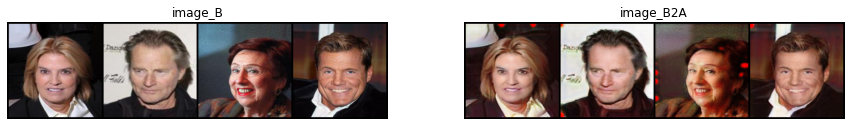

[181/199][0/29] Loss_D: 0.1062 Loss_G: 3.8073 Loss_G_identity: 0.8423 loss_G_GAN: 1.1831 loss_G_cycle: 1.7819
[181/199][10/29] Loss_D: 0.1421 Loss_G: 3.9944 Loss_G_identity: 0.8066 loss_G_GAN: 1.3343 loss_G_cycle: 1.8536
[181/199][20/29] Loss_D: 0.0922 Loss_G: 3.7696 Loss_G_identity: 0.7489 loss_G_GAN: 1.2392 loss_G_cycle: 1.7814
[182/199][0/29] Loss_D: 0.1349 Loss_G: 4.4900 Loss_G_identity: 0.7917 loss_G_GAN: 1.8151 loss_G_cycle: 1.8832
[182/199][10/29] Loss_D: 0.0811 Loss_G: 3.7811 Loss_G_identity: 0.7968 loss_G_GAN: 1.2277 loss_G_cycle: 1.7567
[182/199][20/29] Loss_D: 0.1194 Loss_G: 3.3403 Loss_G_identity: 0.6777 loss_G_GAN: 1.1807 loss_G_cycle: 1.4820
[183/199][0/29] Loss_D: 0.1312 Loss_G: 3.9098 Loss_G_identity: 0.8121 loss_G_GAN: 1.4506 loss_G_cycle: 1.6470
[183/199][10/29] Loss_D: 0.0595 Loss_G: 3.2098 Loss_G_identity: 0.6872 loss_G_GAN: 0.9064 loss_G_cycle: 1.6162
[183/199][20/29] Loss_D: 0.1577 Loss_G: 3.4404 Loss_G_identity: 0.7671 loss_G_GAN: 0.9860 loss_G_cycle: 1.6873
[184

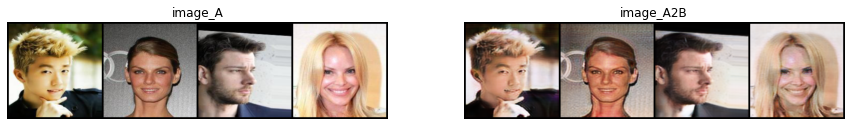

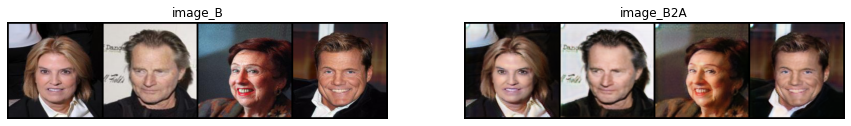

[191/199][0/29] Loss_D: 0.1278 Loss_G: 3.2881 Loss_G_identity: 0.7186 loss_G_GAN: 1.0750 loss_G_cycle: 1.4945
[191/199][10/29] Loss_D: 0.1768 Loss_G: 3.0334 Loss_G_identity: 0.6531 loss_G_GAN: 1.0165 loss_G_cycle: 1.3637
[191/199][20/29] Loss_D: 0.1834 Loss_G: 3.6129 Loss_G_identity: 0.7230 loss_G_GAN: 1.2756 loss_G_cycle: 1.6143
[192/199][0/29] Loss_D: 0.1763 Loss_G: 3.4472 Loss_G_identity: 0.7606 loss_G_GAN: 1.0726 loss_G_cycle: 1.6141
[192/199][10/29] Loss_D: 0.1225 Loss_G: 3.2100 Loss_G_identity: 0.6479 loss_G_GAN: 1.1202 loss_G_cycle: 1.4419
[192/199][20/29] Loss_D: 0.1586 Loss_G: 3.1725 Loss_G_identity: 0.6377 loss_G_GAN: 1.2496 loss_G_cycle: 1.2852
[193/199][0/29] Loss_D: 0.1463 Loss_G: 3.0996 Loss_G_identity: 0.6177 loss_G_GAN: 1.0555 loss_G_cycle: 1.4264
[193/199][10/29] Loss_D: 0.1637 Loss_G: 3.4089 Loss_G_identity: 0.7027 loss_G_GAN: 1.1592 loss_G_cycle: 1.5470
[193/199][20/29] Loss_D: 0.1056 Loss_G: 3.3838 Loss_G_identity: 0.6706 loss_G_GAN: 1.2405 loss_G_cycle: 1.4726
[194

In [21]:
test = next(iter(test_loader))
real_image_A1,real_image_B1 = test["A"], test["B"]#选出一组测试样本
for epoch in range(0, epochs):
    for i, data in enumerate(train_loader):
        # get batch size data
        real_image_A = data["A"].to(device)
        real_image_B = data["B"].to(device)
        batch_size = real_image_A.shape[0]

        # real data label is 1, fake data label is 0.
        real_label = torch.full((batch_size, 1), 1, device=device, dtype=torch.float32)
        fake_label = torch.full((batch_size, 1), 0, device=device, dtype=torch.float32)

        ##############################################
        # (1) Update G network: Generators A2B and B2A
        ##############################################

        # Set G_A and G_B's gradients to zero
        optimizer_G.zero_grad()

        # Identity loss 
        # G_B2A(A) should equal A if real A is fed
        identity_image_A = netG_B2A(real_image_A)
        loss_identity_A = identity_loss(identity_image_A, real_image_A) * 5.0
        # G_A2B(B) should equal B if real B is fed
        identity_image_B = netG_A2B(real_image_B)
        loss_identity_B = identity_loss(identity_image_B, real_image_B) * 5.0

        # GAN loss
        # GAN loss D_A(G_B2A(B))
        fake_image_A = netG_B2A(real_image_B)
        fake_output_A = netD_A(fake_image_A)
        loss_GAN_B2A = adversarial_loss(fake_output_A, real_label)
        # GAN loss D_B(G_A2B(A))
        fake_image_B = netG_A2B(real_image_A)
        fake_output_B = netD_B(fake_image_B)
        loss_GAN_A2B = adversarial_loss(fake_output_B, real_label)

        # Cycle loss
        recovered_image_A = netG_B2A(fake_image_B)
        loss_cycle_ABA = cycle_loss(recovered_image_A, real_image_A) * 10.0

        recovered_image_B = netG_A2B(fake_image_A)
        loss_cycle_BAB = cycle_loss(recovered_image_B, real_image_B) * 10.0

        # Combined loss and calculate gradients
        errG = loss_identity_A + loss_identity_B + loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB

        # Calculate gradients for G_A and G_B
        errG.backward()
        # Update G_A and G_B's weights
        optimizer_G.step()

        ##############################################
        # (2) Update D network: Discriminator A
        ##############################################

        # Set D_A gradients to zero
        optimizer_D_A.zero_grad()

        # Real A image loss
        real_output_A = netD_A(real_image_A)
        errD_real_A = adversarial_loss(real_output_A, real_label)

        # Fake A image loss
        fake_image_A = fake_A_buffer.push_and_pop(fake_image_A)
        fake_output_A = netD_A(fake_image_A.detach())
        errD_fake_A = adversarial_loss(fake_output_A, fake_label)

        # Combined loss and calculate gradients
        errD_A = (errD_real_A + errD_fake_A) / 2

        # Calculate gradients for D_A
        errD_A.backward()
        # Update D_A weights
        optimizer_D_A.step()

        ##############################################
        # (3) Update D network: Discriminator B
        ##############################################

        # Set D_B gradients to zero
        optimizer_D_B.zero_grad()

        # Real B image loss
        real_output_B = netD_B(real_image_B)
        errD_real_B = adversarial_loss(real_output_B, real_label)

        # Fake B image loss
        fake_image_B = fake_B_buffer.push_and_pop(fake_image_B)
        fake_output_B = netD_B(fake_image_B.detach())
        errD_fake_B = adversarial_loss(fake_output_B, fake_label)

        # Combined loss and calculate gradients
        errD_B = (errD_real_B + errD_fake_B) / 2

        # Calculate gradients for D_B
        errD_B.backward()
        # Update D_B weights
        optimizer_D_B.step()


    # Update learning rates



        if i % print_freq ==0:
            print(
                f"[{epoch}/{epochs - 1}][{i}/{len(train_loader) - 1}] "
                f"Loss_D: {(errD_A + errD_B).item():.4f} "
                f"Loss_G: {errG.item():.4f} "
                f"Loss_G_identity: {(loss_identity_A + loss_identity_B).item():.4f} "
                f"loss_G_GAN: {(loss_GAN_A2B + loss_GAN_B2A).item():.4f} "
                f"loss_G_cycle: {(loss_cycle_ABA + loss_cycle_BAB).item():.4f}")
    if epoch % 10 ==0:
        plt.figure(figsize=(15,15))
        plt.subplot(2,2,1)
        plt.axis("off")
        plt.title("image_A")
        plt.imshow(np.transpose(torchvision.utils.make_grid(real_image_A1.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        fake_image_A2B = 0.5 * (netG_A2B(real_image_A1.to(device).detach()).data + 1.0)
        plt.subplot(2,2,2)
        plt.axis("off")
        plt.title("image_A2B")
        plt.imshow(np.transpose(torchvision.utils.make_grid(fake_image_A2B.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        plt.show()


        plt.figure(figsize=(15,15))
        plt.subplot(1,2,1)
        plt.axis("off")
        plt.title("image_B")
        plt.imshow(np.transpose(torchvision.utils.make_grid(real_image_B1.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        fake_image_B2A = 0.5 * (netG_B2A(real_image_B1.to(device).detach()).data + 1.0)
        plt.subplot(1,2,2)
        plt.axis("off")
        plt.title("image_B2A")
        plt.imshow(np.transpose(torchvision.utils.make_grid(fake_image_B2A.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        plt.show()
    # Update learning rates
    lr_scheduler_G.step()
    lr_scheduler_D_A.step()
    lr_scheduler_D_B.step()






In [25]:
torch.save(netG_A2B.state_dict(), "facenetG_A2B.pth")
torch.save(netG_B2A.state_dict(), "facenetG_B2A.pth")
torch.save(netD_A.state_dict(), "facenetD_A.pth")
torch.save(netD_B.state_dict(), "facenetD_B.pth")

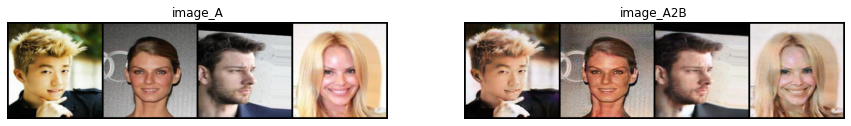

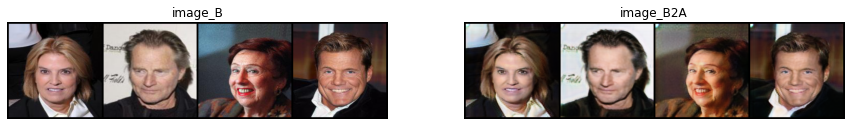

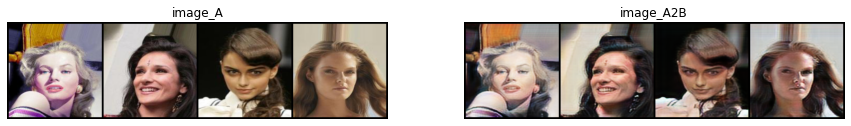

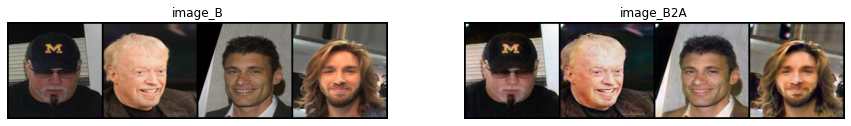

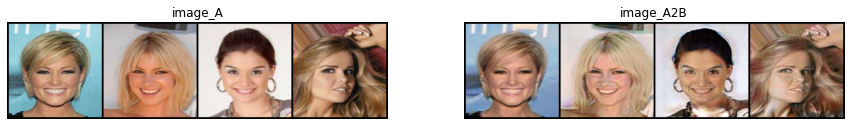

...

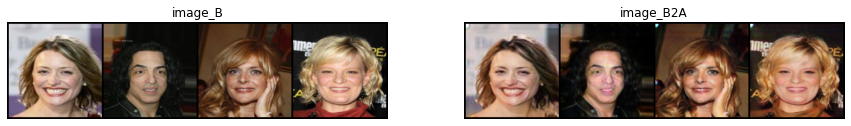

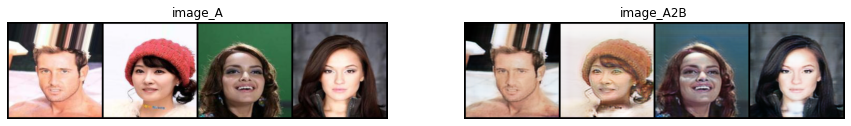

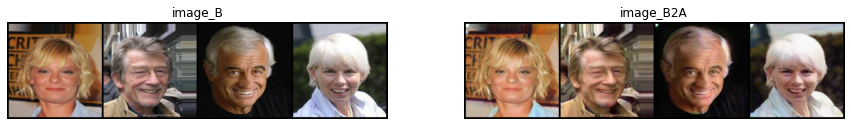

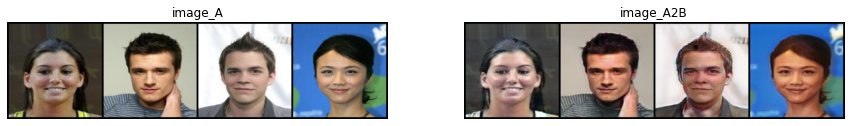

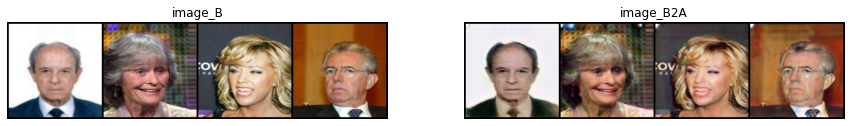

IsADirectoryError: [Errno 21] Is a directory: 'data/hw_data/old-young/trainA/.ipynb_checkpoints'

In [28]:
with torch.no_grad():
    for test in test_loader:
        real_image_A1,real_image_B1 = test["A"], test["B"]
        plt.figure(figsize=(15,15))
        plt.subplot(2,2,1)
        plt.axis("off")
        plt.title("image_A")
        plt.imshow(np.transpose(torchvision.utils.make_grid(real_image_A1.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        fake_image_A2B = 0.5 * (netG_A2B(real_image_A1.to(device).detach()).data + 1.0)
        plt.subplot(2,2,2)
        plt.axis("off")
        plt.title("image_A2B")
        plt.imshow(np.transpose(torchvision.utils.make_grid(fake_image_A2B.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        plt.show()


        plt.figure(figsize=(15,15))
        plt.subplot(1,2,1)
        plt.axis("off")
        plt.title("image_B")
        plt.imshow(np.transpose(torchvision.utils.make_grid(real_image_B1.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        fake_image_B2A = 0.5 * (netG_B2A(real_image_B1.to(device).detach()).data + 1.0)
        plt.subplot(1,2,2)
        plt.axis("off")
        plt.title("image_B2A")
        plt.imshow(np.transpose(torchvision.utils.make_grid(fake_image_B2A.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        plt.show()



In [22]:
picture = test_transform(Image.open('data/hw data/face/picture/4.jpg').convert('RGB')).unsqueeze(0)

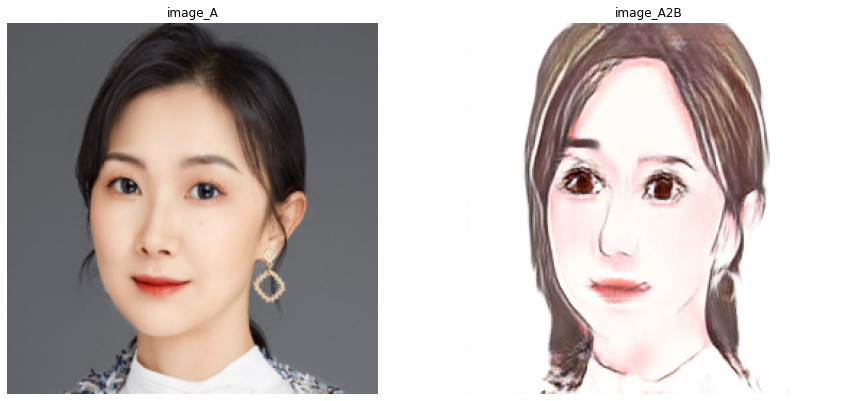

In [23]:
with torch.no_grad():
    real_image_A1 = picture
    plt.figure(figsize=(15,15))
    plt.subplot(2,2,1)
    plt.axis("off")
    plt.title("image_A")
    plt.imshow(np.transpose(torchvision.utils.make_grid(real_image_A1.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
    fake_image_A2B = 0.5 * (netG_A2B(real_image_A1.to(device).detach()).data + 1.0)
    plt.subplot(2,2,2)
    plt.axis("off")
    plt.title("image_A2B")
    plt.imshow(np.transpose(torchvision.utils.make_grid(fake_image_A2B.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
    plt.show()



练习三

（选做）基于CycleGAN来进行年老年轻图片转换。并可尝试如何在模型基础上进行修改以更适合人脸图像。数据来源于[celeba—A](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)人脸数据，根据属性标签文件`list_attr_celeba.txt`筛选出年老年轻人脸数据，保存在`data/old-young`文件夹中。